In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import scipy.stats as stats
from google.colab import files
np.random.seed(42)

In [ ]:
n = 500
time = np.arange(0, n)
coinflips = np.random.randint(0, 2, size=(n-1, )) # n-1 random steps, n total positions plotted
numheads = np.sum(coinflips)
coinflips[coinflips == 0] = -1
pos = np.concatenate(([0], np.cumsum(coinflips))) # start at zero

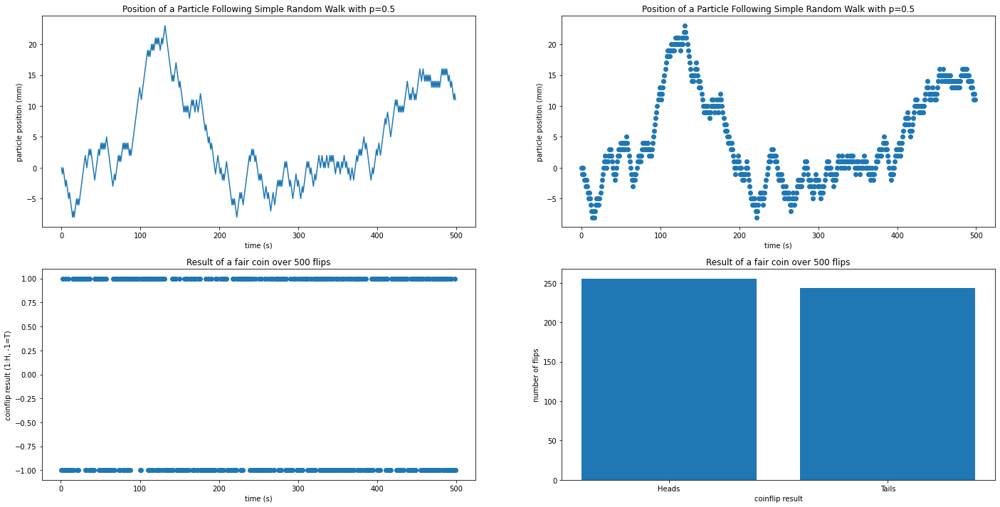

In [ ]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(24, 12))
ax1.plot(time, pos)
ax1.set_xlabel("time (s)")
ax1.set_ylabel("particle position (mm)")
ax1.set_title("Position of a Particle Following Simple Random Walk with p=0.5")

ax2.scatter(time, pos)
ax2.set_xlabel("time (s)")
ax2.set_ylabel("particle position (mm)")
ax2.set_title("Position of a Particle Following Simple Random Walk with p=0.5")

ax3.scatter(time[1:], coinflips)
ax3.set_xlabel("time (s)")
ax3.set_ylabel("coinflip result (1:H, -1=T)")
ax3.set_title("Result of a fair coin over {} flips".format(n))

ax4.bar(["Heads", "Tails"], [numheads, n-1-numheads])
ax4.set_xlabel("coinflip result")
ax4.set_ylabel("number of flips")
ax4.set_title("Result of a fair coin over {} flips".format(n))

plt.show()

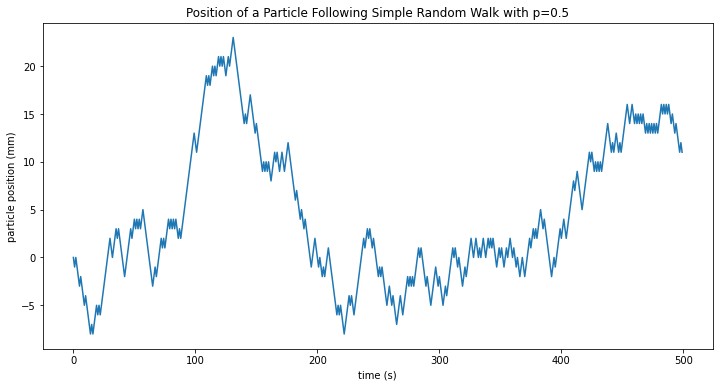

In [ ]:
fig, ax1 = plt.subplots(1, 1, figsize=(12, 6))
ax1.plot(time, pos)
ax1.set_xlabel("time (s)")
ax1.set_ylabel("particle position (mm)")
ax1.set_title("Position of a Particle Following Simple Random Walk with p=0.5")

plt.savefig("1d-random-walk.png")

In [ ]:
# average h over time
avgpos = np.cumsum(pos, dtype=float) # running summed positions
avgpos = avgpos / (np.arange(n) + 1)

# average h^2 over time
sqdpos = pos * pos
avgsqdpos = np.cumsum(sqdpos, dtype=float) # running summed positions
avgsqdpos = avgsqdpos / (np.arange(n) + 1)

# dataframe for display as a table
avgpos_df = pd.DataFrame(np.transpose([time, avgpos, avgsqdpos]), columns=("timestamp", "running average position", "running average squared position"))
"""
with pd.option_context('display.max_rows', None,
                       'display.max_columns', None,
                       'display.precision', 3,
                       ):
    print(avgpos_df.to_string(index=False))
"""
print(avgpos_df)

     timestamp  running average position  running average squared position
0          0.0                  0.000000                          0.000000
1          1.0                 -0.500000                          0.500000
2          2.0                 -0.333333                          0.333333
3          3.0                 -0.500000                          0.500000
4          4.0                 -0.800000                          1.200000
..         ...                       ...                               ...
495      495.0                  4.435484                         74.362903
496      496.0                  4.450704                         74.503018
497      497.0                  4.463855                         74.596386
498      498.0                  4.478958                         74.735471
499      499.0                  4.492000                         74.828000

[500 rows x 3 columns]


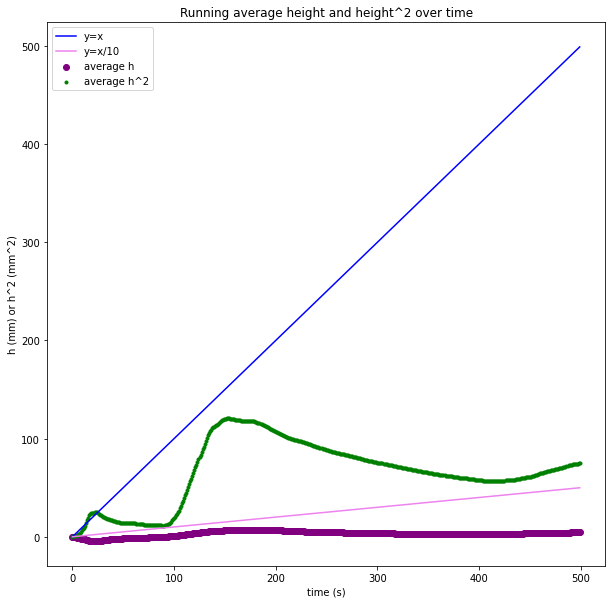

In [ ]:
fig, ax = plt.subplots(figsize=(10, 10))
ax.scatter(time, avgpos, label="average h", color="purple")
ax.scatter(time, avgsqdpos, label="average h^2", color="green", marker=".")
ax.plot(time, time, label="y=x", color="blue")
ax.plot(time, time/10, label="y=x/10", color="violet")
ax.set_xlabel("time (s)")
ax.set_ylabel("h (mm) or h^2 (mm^2)")
ax.set_title("Running average height and height^2 over time")
ax.legend()

plt.savefig("avg-height.png")

Average of $h^2$ is the better measure, since it describes average squared *distance* as well as average squared *position*. In contrast, the average of $h$ describes only position, and can be close to zero even if the particle has spent a large part of the random walk far from the origin.

In [ ]:
np.random.seed(42)
rolls = np.random.randint(1, 5, size=(n-1,1,))
dis = np.choose(rolls, [[0, 0], [-1, 0], [0, -1], [1, 0], [0, 1]]) # displacement
pos = np.concatenate(([[0, 0]], np.cumsum(dis, axis=0)), axis=0)

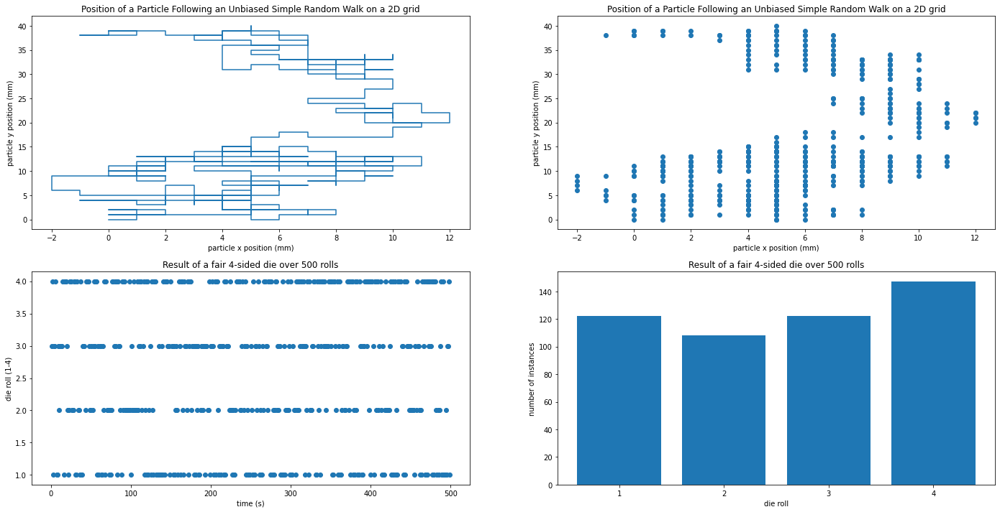

In [ ]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(24, 12))
ax1.plot(np.transpose(pos)[0], np.transpose(pos)[1])
ax1.set_xlabel("particle x position (mm)")
ax1.set_ylabel("particle y position (mm)")
ax1.set_title("Position of a Particle Following an Unbiased Simple Random Walk on a 2D grid")

ax2.scatter(np.transpose(pos)[0], np.transpose(pos)[1])
ax2.set_xlabel("particle x position (mm)")
ax2.set_ylabel("particle y position (mm)")
ax2.set_title("Position of a Particle Following an Unbiased Simple Random Walk on a 2D grid")

ax3.scatter(time[1:], rolls)
ax3.set_xlabel("time (s)")
ax3.set_ylabel("die roll (1-4)")
ax3.set_title("Result of a fair 4-sided die over {} rolls".format(n))

ax4.bar(["1", "2", "3", "4"], [np.count_nonzero(rolls == 1), np.count_nonzero(rolls == 2), np.count_nonzero(rolls == 3), np.count_nonzero(rolls == 4)])
ax4.set_xlabel("die roll")
ax4.set_ylabel("number of instances")
ax4.set_title("Result of a fair 4-sided die over {} rolls".format(n))

plt.show()

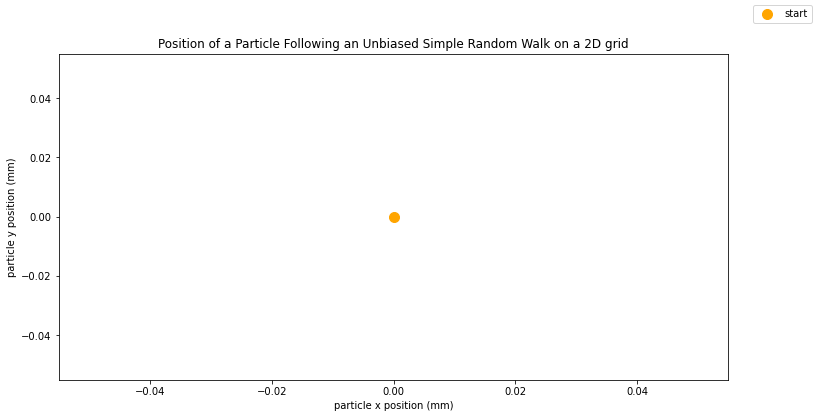

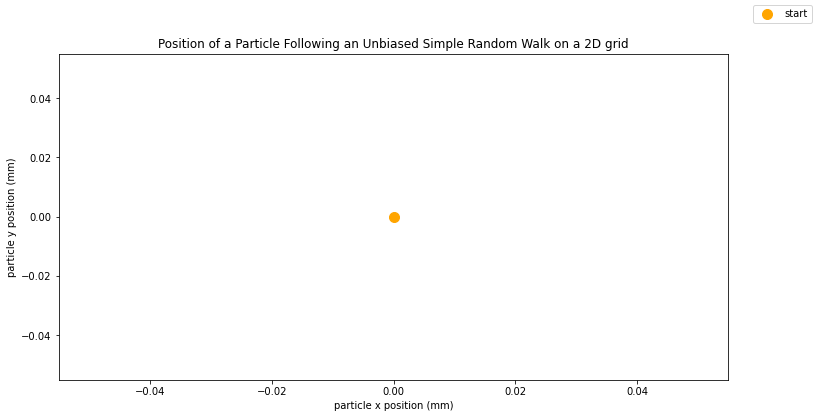

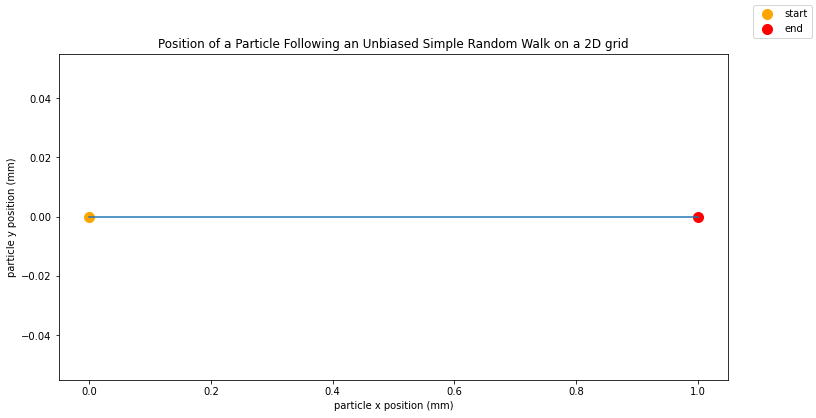

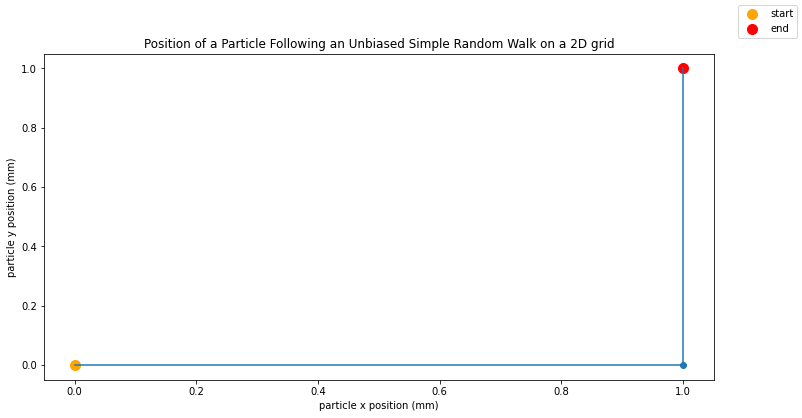

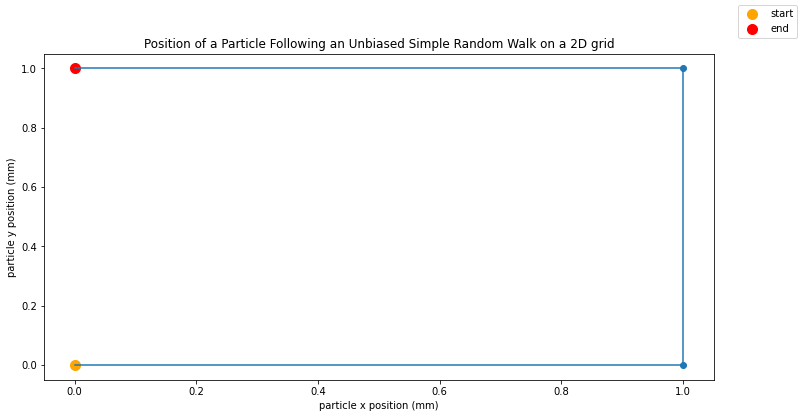

...

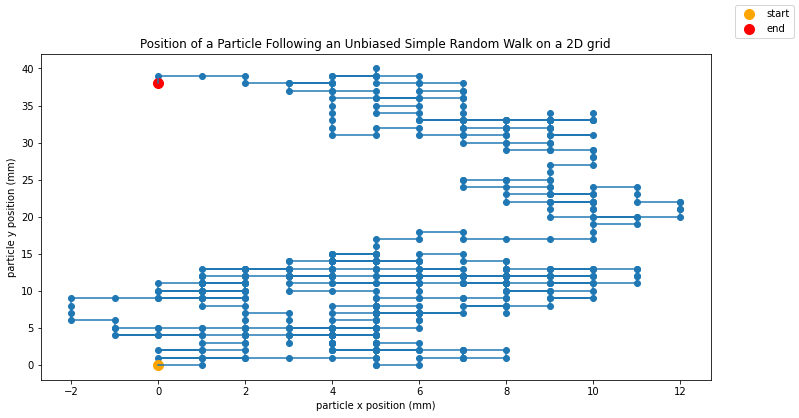

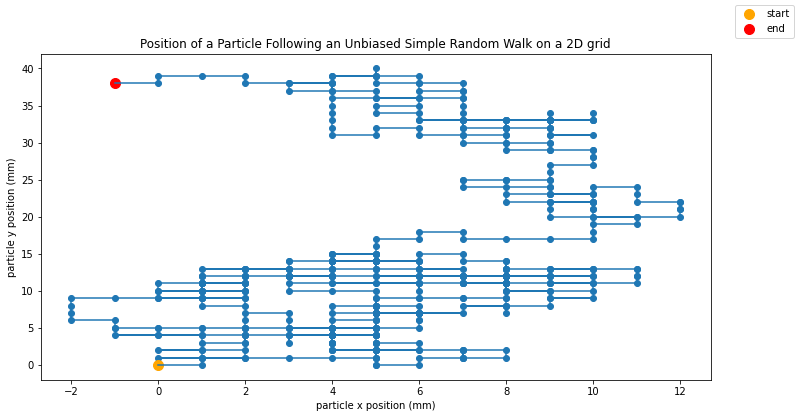

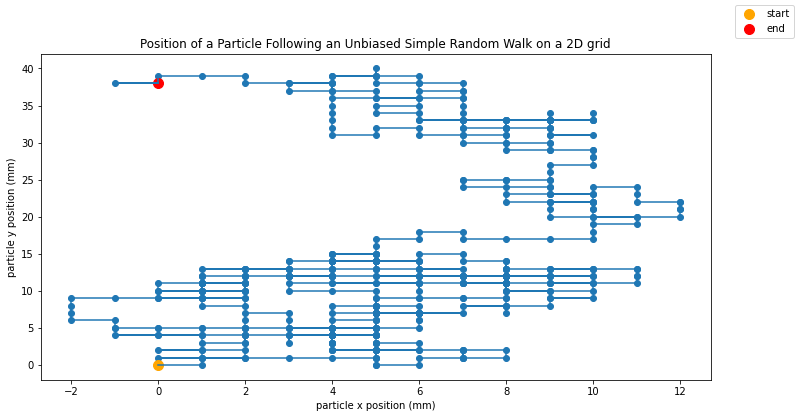

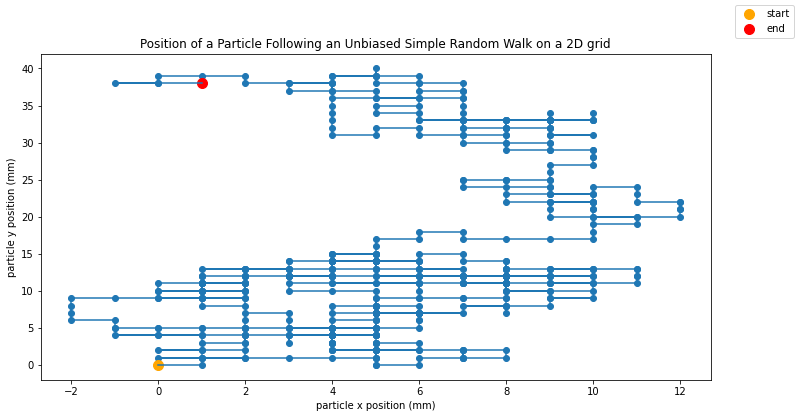

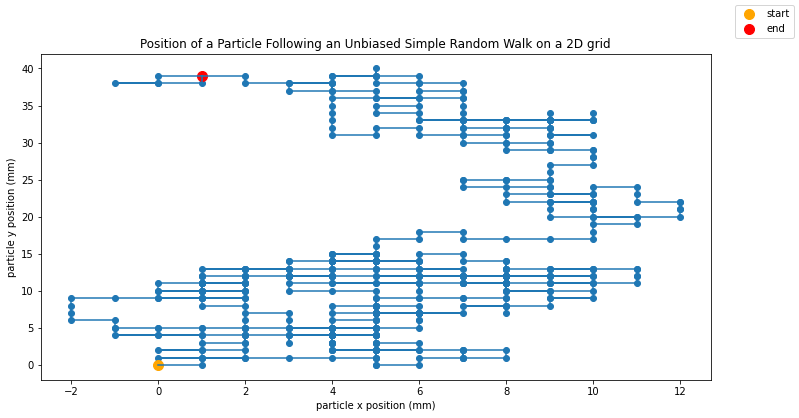

In [ ]:
for k in range(0, len(time)): #3
  fig, ax1 = plt.subplots(1, 1, figsize=(12, 6))
  ax1.plot(np.transpose(pos)[0][:k], np.transpose(pos)[1][:k])
  ax1.scatter(np.transpose(pos)[0][:k], np.transpose(pos)[1][:k])
  ax1.set_xlabel("particle x position (mm)")
  ax1.set_ylabel("particle y position (mm)")
  ax1.set_title("Position of a Particle Following an Unbiased Simple Random Walk on a 2D grid")
  ax1.scatter([0], [0], color="orange", label="start", s=100)
  if k > 1:
    ax1.scatter(pos[k-1][0], pos[k-1][1], color="red", label="end", s=100)
  fig.legend()

  plt.savefig("2d-random-walk/{}.png".format(k))
  #files.download("2d-random-walk/{}.png".format(k))
  plt.show()

In [ ]:
!zip -r /content/2d-random-walk.zip /content/2d-random-walk/
files.download("/content/2d-random-walk.zip")

  adding: content/2d-random-walk/ (stored 0%)
  adding: content/2d-random-walk/58.png (deflated 16%)
  adding: content/2d-random-walk/497.png (deflated 9%)
  adding: content/2d-random-walk/248.png (deflated 12%)
  adding: content/2d-random-walk/459.png (deflated 10%)
  adding: content/2d-random-walk/27.png (deflated 16%)
  adding: content/2d-random-walk/80.png (deflated 15%)
  adding: content/2d-random-walk/381.png (deflated 12%)
  adding: content/2d-random-walk/302.png (deflated 12%)
  adding: content/2d-random-walk/102.png (deflated 15%)
  adding: content/2d-random-walk/32.png (deflated 16%)
  adding: content/2d-random-walk/136.png (deflated 15%)
  adding: content/2d-random-walk/277.png (deflated 12%)
  adding: content/2d-random-walk/103.png (deflated 15%)
  adding: content/2d-random-walk/445.png (deflated 10%)
  adding: content/2d-random-walk/19.png (deflated 15%)
  adding: content/2d-random-walk/98.png (deflated 15%)
  adding: content/2d-random-walk/310.png (deflated 12%)
  adding:

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
np.random.seed(42)
n = 1000 # number of increments
time = np.arange(0, 1 + 1/n, 1/n)
inc = np.random.normal(size=(n,))
pos = np.concatenate(([0], np.cumsum(inc)))

In [ ]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(24, 12))
ax1.plot(time, pos)
ax1.set_xlabel("time (s)")
ax1.set_ylabel("particle position (mm)")
ax1.set_title("Position of a Particle Following Standard Brownian Motion")

ax2.scatter(time, pos)
ax2.set_xlabel("time (s)")
ax2.set_ylabel("particle position (mm)")
ax2.set_title("Position of a Particle Following Standard Brownian Motion")

ax3.scatter(time[1:], inc)
ax3.set_xlabel("time (s)")
ax3.set_ylabel("increment (mm)")
ax3.set_title("Increment of a Particle Following Standard Brownian Motion")

x = np.linspace(-3, 3, 100)
ax4.plot(x, stats.norm.pdf(x, 0, 1))
ax4.scatter(inc, np.full((n,), 0.1))
ax4.set_xlabel("increment (mm)")
ax4.set_ylabel("probability density")
ax4.set_title("Sample Increments vs Standard Normal Distribution")

plt.show()

In [ ]:
fig, ax1 = plt.subplots(1, 1, figsize=(12, 6))
ax1.plot(time, pos)
ax1.set_xlabel("time (s)")
ax1.set_ylabel("particle position (mm)")
ax1.set_title("Position of a Particle Following Standard Brownian Motion")

plt.savefig("classical-brownian-motion.png")